In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import math
import pandas as pd
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
# Set constants
IMG_SIZE = 299
BATCH_SIZE = 32
EPOCHS = 50
AUTOTUNE = tf.data.AUTOTUNE

# Define file names
initial_model_filename = "food101_Inception_model_wholeds_.h5"
finetuned_model_filename = "food101_Inception_model_finetuning_wholeds_.h5"

In [3]:
# Load Food-101 dataset (TFDS)
dataset_name = "food101"
(ds_train, ds_test), dataset_info = tfds.load(
    dataset_name,
    split=["train", "validation"],
    as_supervised=True,
    with_info=True
)

print("Dataset Loaded:", dataset_name)

# Get class names from dataset metadata
all_class_names = dataset_info.features["label"].names

num_classes = len(all_class_names)

# Convert class names to indices for filtering
selected_class_indices = {i: i for i in range(num_classes)}

print(f"Label names: {all_class_names}")
print(f"Total classes: {num_classes}")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.1B5N0P_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.1B5N0P_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.
Dataset Loaded: food101
Label names: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour

In [4]:
dataset_info

tfds.core.DatasetInfo(
    name='food101',
    full_name='food101/2.0.0',
    description="""
    This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.
    """,
    homepage='https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/',
    data_dir='/root/tensorflow_datasets/food101/2.0.0',
    file_format=tfrecord,
    download_size=4.65 GiB,
    dataset_size=4.77 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    split

In [5]:
# Check the number of examples in the training and test datasets
train_size = len(ds_train)
test_size = len(ds_test)

print(f"Training set size: {train_size}")
print(f"Test set size: {test_size}")

Training set size: 75750
Test set size: 25250


In [6]:
# Check the shape of a batch from the train and test datasets
for image, label in ds_train.take(1):  # Take one batch from the train set
    print("Train batch shape:", image.shape)

for image, label in ds_test.take(1):  # Take one batch from the test set
    print("Test batch shape:", image.shape)

Train batch shape: (512, 512, 3)
Test batch shape: (382, 512, 3)


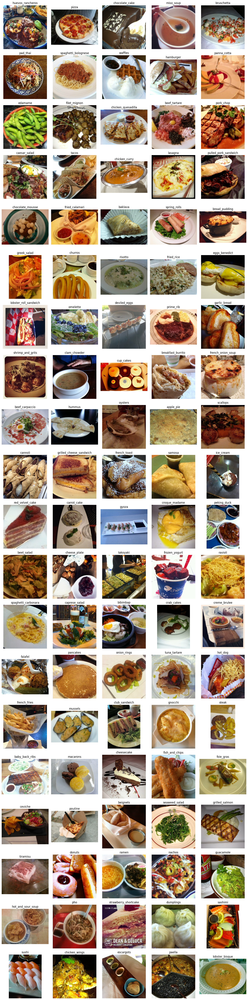

In [7]:
# Create a dictionary to store one sample per class
sample_images = {}

# Iterate through the dataset to collect one image per class
for image, label in ds_train.take(500):  # Take enough samples to ensure we find all classes
    class_index = label.numpy()
    if class_index not in sample_images:
        sample_images[class_index] = image
    if len(sample_images) == num_classes:  # Stop when we have one sample for each of the 101 classes
        break

# Dynamically determine grid size
cols = min(num_classes, 5)
rows = math.ceil(num_classes / cols)

# Plot images
plt.figure(figsize=(cols * 3, rows * 3))
for i, (class_index, image) in enumerate(sample_images.items()):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image.numpy().astype("uint8"))
    plt.title(all_class_names[class_index])
    plt.axis("off")

plt.tight_layout()
plt.show()

In [11]:
# Preprocessing Function (Resizing & Normalisation)
def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))  # Resize to IMG_SIZE
    image = preprocess_input(image)  # Apply InceptionV3 preprocessing
    return image, label

# Apply preprocessing
ds_train_preprocessed = ds_train.map(preprocess, num_parallel_calls=AUTOTUNE)
ds_test_preprocessed = ds_test.map(preprocess, num_parallel_calls=AUTOTUNE)

# Data Augmentation Function
def augment(image, label):
    # Randomly flip images
    image = tf.image.random_flip_left_right(image)
    # Randomly adjust contrast
    image = tf.image.random_contrast(image, 0.8, 1.2)

    # Randomly shift image horizontally and vertically
    image = tf.image.resize(image, (IMG_SIZE + 20, IMG_SIZE + 20))  # Resize to larger size
    image = tf.image.random_crop(image, size=[IMG_SIZE, IMG_SIZE, 3])  # Crop back to original size

    # Randomly zoom in/out
    scale = tf.random.uniform([], 0.8, 1.0)
    new_size = tf.cast(tf.shape(image)[:2], tf.float32) * scale  # Cast the shape to float32 before multiplication
    new_size = tf.cast(new_size, tf.int32)  # Convert the result back to int32
    image = tf.image.resize(image, new_size)  # Resize image

    # Randomly shift channel intensity
    image = tf.image.random_brightness(image, 0.3)

    # Resize back to original size
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    return image, label


# Apply augmentation to training data
ds_train_final = ds_train_preprocessed.map(augment).batch(BATCH_SIZE).prefetch(AUTOTUNE)
ds_test_final = ds_test_preprocessed.batch(BATCH_SIZE).prefetch(AUTOTUNE)


In [12]:
# Define EarlyStopping
early_stopping = EarlyStopping(
    monitor="val_accuracy",  # Stop based on validation accuracy
    patience=5,  # Wait 5 epochs before stopping if no improvement
    restore_best_weights=True,  # Load best weights after stopping
    verbose=1
)

lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",  # Adjust based on validation loss
    factor=0.5,  # Reduce learning rate by half
    patience=3,  # Wait 3 epochs before reducing
    min_lr=1e-6,  # Don't reduce below this
    verbose=1
)

# Load Pretrained InceptionV3 Model
base_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
base_model.trainable = False  # Freeze base layers

# Add Custom Classification Head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)

output_layer = Dense(num_classes, activation="softmax")(x)

# Create model
model = Model(inputs=base_model.input, outputs=output_layer)

# Compile model
model.compile(optimizer=Adam(learning_rate=0.0001), loss="sparse_categorical_crossentropy", metrics=["accuracy"])

model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 149, 149, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 149, 149, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 149, 149, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 147, 147, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 147, 147, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 147, 147, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 147, 147, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 147, 147, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 147, 147, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 73, 73, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 73, 73, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 73, 73, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 71, 71, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 71, 71, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 22,353,285 (85.27 MB)

 Trainable params: 550,501 (2.10 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [13]:
# Train Model with EarlyStopping
start_time = time.time()
history = model.fit(ds_train_final, validation_data=ds_test_final, epochs=EPOCHS, callbacks=[early_stopping, lr_scheduler])
end_time = time.time()

# Save initial model
model.save(initial_model_filename)
print(f"Model saved as: {initial_model_filename}")

# Print runtime
print(f"Training Time: {end_time - start_time:.2f} seconds")


Epoch 1/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 250s 97ms/step - accuracy: 0.0631 - loss: 4.3778 - val_accuracy: 0.3936 - val_loss: 2.6858 - learning_rate: 1.0000e-04
Epoch 2/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 205s 87ms/step - accuracy: 0.2435 - loss: 3.1780 - val_accuracy: 0.4720 - val_loss: 2.1837 - learning_rate: 1.0000e-04
Epoch 3/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 205s 86ms/step - accuracy: 0.3120 - loss: 2.8095 - val_accuracy: 0.5026 - val_loss: 1.9977 - learning_rate: 1.0000e-04
Epoch 4/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.3449 - loss: 2.6439 - val_accuracy: 0.5264 - val_loss: 1.8792 - learning_rate: 1.0000e-04
Epoch 5/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.3703 - loss: 2.5217 - val_accuracy: 0.5364 - val_loss: 1.8244 - learning_rate: 1.0000e-04
Epoch 6/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 207s 87ms/step - accuracy: 0.3882 - loss: 2.4497 - val_accuracy: 0.5477 - val_loss: 1.7595 - learning_rate: 1.0000e-04
Epoch 7/50
2368/2368 ━━━━━━━━━━━━━

Model saved as: food101_Inception_model_wholeds_.h5
Training Time: 10337.48 seconds


In [14]:
# Fine-Tuning (Unfreeze some layers)
base_model.trainable = True
for layer in base_model.layers[:200]:  # Keep first 200 layers frozen
    layer.trainable = False

# Recompile with lower learning rate
model.compile(optimizer=Adam(learning_rate=0.00001), loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Train Again (Fine-Tuning)
start_time = time.time()
history_fine_tune = model.fit(ds_train_final, validation_data=ds_test_final, epochs=EPOCHS, callbacks=[early_stopping, lr_scheduler])
end_time = time.time()

# Save fine-tuned model
model.save(finetuned_model_filename)
print(f"Model saved as: {finetuned_model_filename}")

print(f"Fine-Tuning Time: {end_time - start_time:.2f} seconds")

# Evaluate on Test Set
test_loss, test_acc = model.evaluate(ds_test_final)
print(f"Test Accuracy: {test_acc*100:.4f}%")
print(f"Test Loss: {test_loss:.4f}")


Epoch 1/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 261s 97ms/step - accuracy: 0.3699 - loss: 2.5841 - val_accuracy: 0.6517 - val_loss: 1.3062 - learning_rate: 1.0000e-05
Epoch 2/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 207s 87ms/step - accuracy: 0.5155 - loss: 1.8938 - val_accuracy: 0.6843 - val_loss: 1.1684 - learning_rate: 1.0000e-05
Epoch 3/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.5544 - loss: 1.7055 - val_accuracy: 0.7030 - val_loss: 1.0926 - learning_rate: 1.0000e-05
Epoch 4/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.5929 - loss: 1.5589 - val_accuracy: 0.7184 - val_loss: 1.0332 - learning_rate: 1.0000e-05
Epoch 5/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.6130 - loss: 1.4568 - val_accuracy: 0.7279 - val_loss: 0.9919 - learning_rate: 1.0000e-05
Epoch 6/50
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 206s 87ms/step - accuracy: 0.6372 - loss: 1.3568 - val_accuracy: 0.7367 - val_loss: 0.9624 - learning_rate: 1.0000e-05
Epoch 7/50
2368/2368 ━━━━━━━━━━━━━

Model saved as: food101_Inception_model_finetuning_wholeds_.h5
Fine-Tuning Time: 5231.34 seconds
790/790 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - accuracy: 0.7656 - loss: 0.9262
Test Accuracy: 76.6337%
Test Loss: 0.9382


In [15]:
# Generate Predictions
y_true, y_pred = [], []
for images, labels in ds_test_final:
    predictions = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━

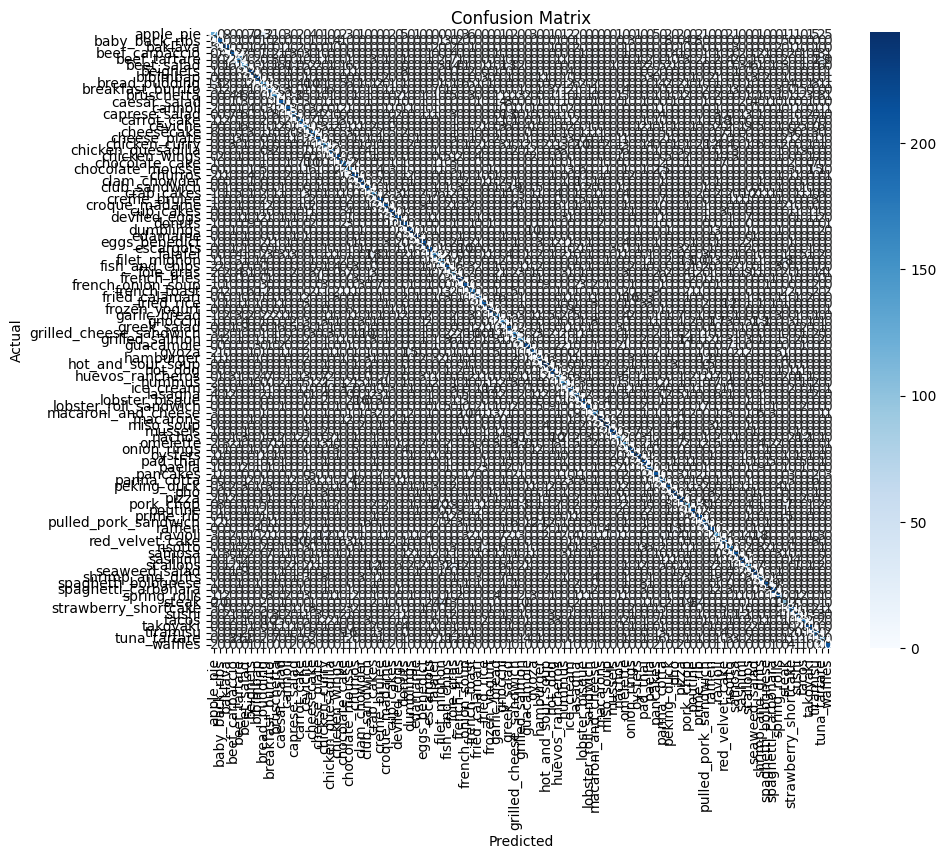

In [16]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=all_class_names, yticklabels=all_class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [17]:
# Classification Report

# Get the classification report as a dictionary
report = classification_report(y_true, y_pred, target_names=all_class_names, output_dict=True)

# Convert the report dictionary to a Pandas DataFrame
report_df = pd.DataFrame(report).transpose()

# Insert the classes as a column at the beginning
report_df.insert(0, 'Class', report_df.index)

# Save the DataFrame to a CSV file
report_df.to_csv('classification_report.csv', index=False)

# Print the classification report (optional)
print("Classification Report:")
print(report_df)

Classification Report:
                         Class  precision    recall  f1-score       support
apple_pie            apple_pie   0.576577  0.512000  0.542373    250.000000
baby_back_ribs  baby_back_ribs   0.768061  0.808000  0.787524    250.000000
baklava                baklava   0.812734  0.868000  0.839458    250.000000
beef_carpaccio  beef_carpaccio   0.789062  0.808000  0.798419    250.000000
beef_tartare      beef_tartare   0.689362  0.648000  0.668041    250.000000
...                        ...        ...       ...       ...           ...
tuna_tartare      tuna_tartare   0.571429  0.544000  0.557377    250.000000
waffles                waffles   0.889362  0.836000  0.861856    250.000000
accuracy              accuracy   0.766337  0.766337  0.766337      0.766337
macro avg            macro avg   0.766780  0.766337  0.765434  25250.000000
weighted avg      weighted avg   0.766780  0.766337  0.765434  25250.000000

[104 rows x 5 columns]


In [21]:
# Calculate average accuracy and loss for training and validation (before fine-tuning)
avg_train_acc = np.mean(history.history['accuracy'])
avg_val_acc = np.mean(history.history['val_accuracy'])
avg_train_loss = np.mean(history.history['loss'])
avg_val_loss = np.mean(history.history['val_loss'])

# Calculate average accuracy and loss for training and validation (after fine-tuning)
avg_train_acc_fine = np.mean(history_fine_tune.history['accuracy'])
avg_val_acc_fine = np.mean(history_fine_tune.history['val_accuracy'])
avg_train_loss_fine = np.mean(history_fine_tune.history['loss'])
avg_val_loss_fine = np.mean(history_fine_tune.history['val_loss'])

# Display results
print("=== Initial Training ===")
print(f"Average Training Accuracy: {avg_train_acc:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.4f}")
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Validation Loss: {avg_val_loss:.4f}\n")

print("=== After Fine-Tuning ===")
print(f"Average Training Accuracy (Fine-Tuned): {avg_train_acc_fine:.4f}")
print(f"Average Validation Accuracy (Fine-Tuned): {avg_val_acc_fine:.4f}")
print(f"Average Training Loss (Fine-Tuned): {avg_train_loss_fine:.4f}")
print(f"Average Validation Loss (Fine-Tuned): {avg_val_loss_fine:.4f}")

=== Initial Training ===
Average Training Accuracy: 0.4438
Average Validation Accuracy: 0.5902
Average Training Loss: 2.2057
Average Validation Loss: 1.5944

=== After Fine-Tuning ===
Average Training Accuracy (Fine-Tuned): 0.7312
Average Validation Accuracy (Fine-Tuned): 0.7466
Average Training Loss (Fine-Tuned): 0.9749
Average Validation Loss (Fine-Tuned): 0.9636


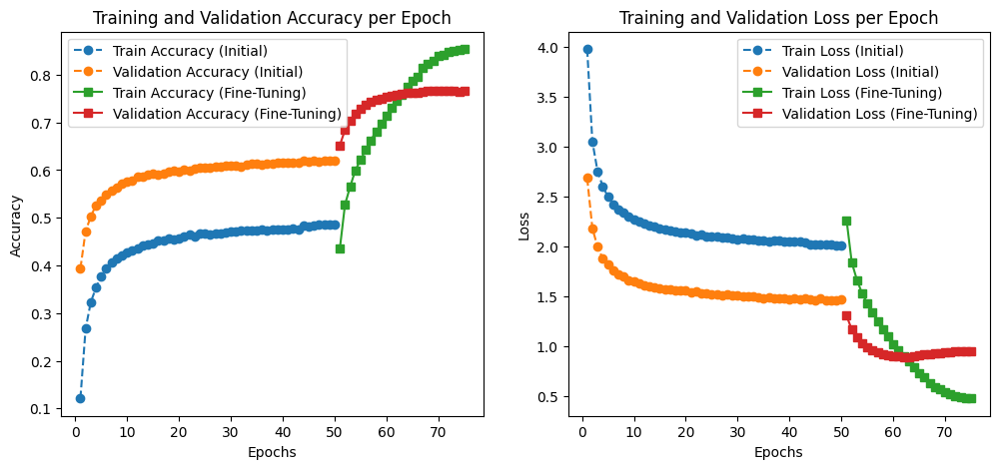

In [19]:
# Extract accuracy and loss for initial training
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Extract accuracy and loss for fine-tuning
fine_tune_train_acc = history_fine_tune.history['accuracy']
fine_tune_val_acc = history_fine_tune.history['val_accuracy']
fine_tune_train_loss = history_fine_tune.history['loss']
fine_tune_val_loss = history_fine_tune.history['val_loss']

# Create epoch index lists for both phases
epochs_initial = range(1, len(train_acc) + 1)
epochs_finetune = range(len(train_acc) + 1, len(train_acc) + len(fine_tune_train_acc) + 1)

plt.figure(figsize=(12, 5))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_initial, train_acc, label="Train Accuracy (Initial)", linestyle="dashed", marker="o")
plt.plot(epochs_initial, val_acc, label="Validation Accuracy (Initial)", linestyle="dashed", marker="o")
plt.plot(epochs_finetune, fine_tune_train_acc, label="Train Accuracy (Fine-Tuning)", linestyle="solid", marker="s")
plt.plot(epochs_finetune, fine_tune_val_acc, label="Validation Accuracy (Fine-Tuning)", linestyle="solid", marker="s")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Training and Validation Accuracy per Epoch")

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_initial, train_loss, label="Train Loss (Initial)", linestyle="dashed", marker="o")
plt.plot(epochs_initial, val_loss, label="Validation Loss (Initial)", linestyle="dashed", marker="o")
plt.plot(epochs_finetune, fine_tune_train_loss, label="Train Loss (Fine-Tuning)", linestyle="solid", marker="s")
plt.plot(epochs_finetune, fine_tune_val_loss, label="Validation Loss (Fine-Tuning)", linestyle="solid", marker="s")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss per Epoch")

plt.show()
